In [1]:
import sys
sys.path.append('C:\\projects\\UTNCE\\src\\utnce202402')

In [2]:
from simplify import *
from prepare import *
from routing import *
from percolation_plot import *
from generate import *
from transfer import *
from copy import deepcopy
from shapely.geometry import Point,LineString
from pyproj import Proj, Transformer
import pickle
import itertools
import random
from sympy import symbols, Eq, solve
import datetime

In [3]:
osm_path = "C:\\projects\\UTNCE\\data\\Amsterdam.large.pbf"

# Subway-Amsterdam 

## Generate Baseline network

In [4]:
# Obtain sub-stations in the city
city_sub_stations = sub_stations(osm_path)

In [5]:
# Obtain subway network data
city_sub_network = subway_network(osm_path)

# Prepare the network edges and nodes based on sub-stations and subway network
edges, nodes = prepare_network(city_sub_network, city_sub_stations)

# Expand the edges if required
edges = expand_edges(edges)

# Obtain sub-routes in the city
city_sub_routes = sub_routes(osm_path)

# Sort the sub-routes
city_sub_routes = sorted_routes(city_sub_routes)

# Check the name and assign a column
check_name = check_to_column(city_sub_routes, city_sub_stations)

topology: 100%|████████████████████████████████████████████████████████████████████| 962/962 [00:00<00:00, 2621.49it/s]


In [6]:
# Calculate dataframe length of nodes and edges of metro for adding it to tram dataframes
id_edges_length_sub = len(edges)
id_nodes_length_sub = len(nodes)

In [7]:
# id_nodes_length_sub

In [8]:
# id_edges_length_sub

In [9]:
# create copy dataframe for nodes and edges
city_sub_edges = pd.DataFrame(edges.copy())
city_sub_nodes = pd.DataFrame(nodes.copy())

In [10]:
# delete useless and wrong edges 
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 771) & (city_sub_edges['to_id'] == 761)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 771) & (city_sub_edges['to_id'] == 766)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 762) & (city_sub_edges['to_id'] == 771)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 767) & (city_sub_edges['to_id'] == 771)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 780) & (city_sub_edges['to_id'] == 773)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 780) & (city_sub_edges['to_id'] == 772)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 774) & (city_sub_edges['to_id'] == 780)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 775) & (city_sub_edges['to_id'] == 780)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 180) & (city_sub_edges['to_id'] == 345)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 491) & (city_sub_edges['to_id'] == 492)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 498) & (city_sub_edges['to_id'] == 499)].index, inplace=True)



city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 634) & (city_sub_edges['to_id'] == 635)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 654) & (city_sub_edges['to_id'] == 655)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 584) & (city_sub_edges['to_id'] == 585)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 569) & (city_sub_edges['to_id'] == 570)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 588) & (city_sub_edges['to_id'] == 589)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 577) & (city_sub_edges['to_id'] == 589)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 607) & (city_sub_edges['to_id'] == 577)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 564) & (city_sub_edges['to_id'] == 565)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 586) & (city_sub_edges['to_id'] == 587)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 643) & (city_sub_edges['to_id'] == 644)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 638) & (city_sub_edges['to_id'] == 639)].index, inplace=True)

city_sub_edges = city_sub_edges.reset_index(drop = True)

In [11]:
# revise Zuid metro stations' coordinates, replace 712 with 180 and 345 nodes to avoid wrong shortest-path edges
geometry_value1 = city_sub_nodes.loc[city_sub_nodes['id'] == 180, 'geometry'].values[0]
geometry_value2 = city_sub_nodes.loc[city_sub_nodes['id'] == 345, 'geometry'].values[0]

city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geometry'] = geometry_value1
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geo_x'] = geometry_value1.x
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geo_y'] = geometry_value1.y

city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geometry'] = geometry_value2
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geo_x'] = geometry_value2.x
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geo_y'] = geometry_value2.y

In [12]:
# city_sub_nodes

In [13]:
# city_sub_stations

In [14]:
# city_sub_edges

In [15]:
# city_sub_routes

In [16]:
# Define replacement dictionary of names of destination stations
replacement_dict = {
     'Amsterdam Centraal': 'Centraal Station',
}
# Replace values in the 'to' column of the metro routes using the replacement dictionary
city_sub_routes['to'] = city_sub_routes['to'].replace(replacement_dict, regex=True).str.strip()

# Reset the index of the metro routes
city_sub_routes = city_sub_routes.reset_index(drop=True)

# Check if the values in the 'to' column of the metro routes match the station names
check_name = check_to_column(city_sub_routes, city_sub_stations)

In [17]:
# # restore DataFrames as pickle files
# city_sub_edges.to_pickle('city_sub_edges_0328.pkl')
# city_sub_stations.to_pickle('city_sub_stations_0328.pkl')
# city_sub_nodes.to_pickle('city_sub_nodes_0328.pkl')
# city_sub_routes.to_pickle('city_sub_routes_0328.pkl')

In [18]:
# Create a dictionary mapping start stations to their corresponding routes
city_sub_start_station_name_dict = start_station_dict(city_sub_routes)

# Create a dictionary mapping subway lines to their corresponding routes
city_sub_line_dict = line_dict(city_sub_routes)

# Create a list of all station names in the city's subway network
city_all_sub_stations_name = all_station_list(city_sub_stations)

# Create a dictionary mapping subway lines to the ordered list of stations on each line
city_sub_order_route_dict = order_stations_inline(city_sub_line_dict, city_all_sub_stations_name, city_sub_routes, city_sub_start_station_name_dict)

In [19]:
# revise station sequence of 51_1 route
df51_1 = pd.read_excel('C:\\projects\\UTNCE\\data\\Metro 51 Centraal Station = Isolatorweg.xlsx',header=None)
df51_1 = df51_1[0::4].reset_index(drop=True)
df51_1.columns = ['name']
df51_1.name[9] = 'Zuid' 
df51_1.name[13] = 'Lelylaan' 
df51_1.name[16] = 'De Vlugtlaan' 

df = city_sub_order_route_dict['Metro 51: Centraal Station => Isolatorweg']
df_reordered = pd.merge(df51_1,df,on='name')

desired_order = ['id', 'name', 'geometry', 'geo_x', 'geo_y']
df_reordered = df_reordered[desired_order]

key_to_replace = 'Metro 51: Centraal Station => Isolatorweg'
city_sub_order_route_dict[key_to_replace] = df_reordered

# city_sub_order_route_dict

In [20]:
# revise station sequence of 52 routes
df52_metro_1 = city_sub_order_route_dict['Metro 52: Noord => Zuid']
df52_metro_2 = city_sub_order_route_dict['Metro 52: Zuid => Noord']

df52_metro_1_dep = df52_metro_1[df52_metro_1.name == 'De Pijp'].copy()
df52_metro_2_dep = df52_metro_2[df52_metro_2.name == 'De Pijp'].copy()


columns_to_swap = ['geometry', 'geo_x', 'geo_y']
for column in columns_to_swap:
    temp = df52_metro_1_dep[column].copy()
    df52_metro_1_dep.loc[df52_metro_1_dep['name'] == 'De Pijp', column] = df52_metro_2_dep.loc[df52_metro_2_dep['name'] == 'De Pijp', column].values
    df52_metro_2_dep.loc[df52_metro_2_dep['name'] == 'De Pijp', column] = temp.values

df52_metro_1.loc[df52_metro_1['name'] == 'De Pijp', columns_to_swap] = df52_metro_1_dep[columns_to_swap].values
df52_metro_2.loc[df52_metro_2['name'] == 'De Pijp', columns_to_swap] = df52_metro_2_dep[columns_to_swap].values

# city_sub_order_route_dict

In [21]:
# city_sub_order_route_dict

In [22]:
# Create a dictionary mapping subway lines to the pairs of station IDs on each line
city_sub_order_id_pairs = id_pairs_inline(city_sub_line_dict, city_sub_order_route_dict, city_sub_nodes)

In [23]:
# Create a graph representing the subway network using the extracted undirected edges and nodes
G = create_ground_graph(city_sub_edges, city_sub_nodes)

# Calculate the shortest path id pairs for each subway line

city_sub_all_shortest_paths_id_dict = city_sub_order_id_pairs.copy()


for line in city_sub_order_id_pairs.keys():
    # Calculate all shortest paths id for the current line using the subway network edges
    city_sub_all_shortest_paths_id_dict[line] = all_shortest_path_id_list(G, city_sub_order_id_pairs[line], city_sub_edges)

In [24]:
# city_sub_all_shortest_paths_id_dict

In [25]:
# city_sub_edges

In [26]:
# Obtain the right ordered edges dataframe of metro
city_sub_ordered_edges = edges_revise_direction(city_sub_all_shortest_paths_id_dict,city_sub_edges)

In [27]:
# city_sub_ordered_edges

In [28]:
# Create a graph representing the subway network using the directed edges and nodes
G = nx.DiGraph()

for _, row in city_sub_nodes.iterrows():
    node = row['id']  # Assuming 'id' is the node identifier
    geometry = row['geometry']
    x, y = geometry.x, geometry.y
    G.add_node(node, pos=(x, y))
    
# Extract the edges from the input DataFrame and create a list of tuples with time
od = city_sub_ordered_edges[['from_id', 'to_id', 'time', 'distance']]
edges_list = []
for i, row in od.iterrows():
    weight_dict = {"weight": row[3]}
    tuple_row = (row[0], row[1], weight_dict)
    edges_list.append(tuple_row)
# edges_list
G.add_edges_from(edges_list)

In [29]:
# Calculate the shortest path pairs for each subway line
city_sub_shortest_path_pairs_dict = city_sub_order_id_pairs.copy()
duplicate_row_count = city_sub_order_id_pairs.copy()
city_sub_shortest_path_edges_dict = city_sub_order_id_pairs.copy()
city_sub_edges_dict = city_sub_order_id_pairs.copy()

for line in city_sub_order_id_pairs.keys():
    # Calculate all shortest paths for the current line using the subway network edges
    city_sub_shortest_path_pairs_dict[line] = all_shortest_paths(G, city_sub_order_id_pairs[line], city_sub_ordered_edges)

    # Count the duplicate rows, calculate the weighted edges for shortest paths,
    # and update the subway network edges for the current line
    duplicate_row_count[line], city_sub_shortest_path_edges_dict[line], city_sub_edges_dict[line] = edges_with_count_weight(city_sub_shortest_path_pairs_dict[line], city_sub_ordered_edges)
    
# Plot all subway routes
# plot_routes(city_sub_routes, city_sub_ordered_edges, city_sub_shortest_path_edges_dict)

## Obtain dataframes of edges,nodes and stations for baseline network of metro

### Add columns to edges--city_sub_extended_edges

In [30]:
city_sub_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_sub_shortest_path_edges_dict, city_sub_routes)

In [31]:
city_sub_extended_edges = add_columns_to_edges(city_sub_shortest_path_edges_dict,city_sub_ordered_edges)

In [32]:
# column_to_drop = 'count_weight'
# city_sub_extended_edges = city_sub_extended_edges.drop(columns=column_to_drop)

In [33]:
# city_sub_extended_edges

### Organize edges dataframe for baseline network--city_sub_new_edges

In [34]:
city_sub_shortest_path_edges_df = pd.concat(city_sub_shortest_path_edges_dict.values()).reset_index(drop=True)
city_sub_shortest_path_edges_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)

In [35]:
# city_sub_shortest_path_edges_df

In [36]:
city_sub_new_edges = pd.merge(city_sub_extended_edges,city_sub_shortest_path_edges_df.geometry,on='geometry',how='inner')

In [37]:
# city_sub_new_edges

### Organize nodes dataframe for baseline network--city_sub_new_nodes

In [38]:
city_sub_shortest_path_nodes_id = pd.DataFrame(list(city_sub_new_edges['from_id'])+list(city_sub_new_edges['to_id'])).drop_duplicates(ignore_index = True)

In [39]:
city_sub_shortest_path_nodes_id = city_sub_shortest_path_nodes_id.rename(columns={0:'id'})

In [40]:
# city_sub_shortest_path_nodes_id

In [41]:
city_sub_new_nodes = pd.merge(city_sub_shortest_path_nodes_id,city_sub_nodes,on='id',how='left').reset_index(drop=True)

In [42]:
# city_sub_new_nodes

### Add columns to stations--city_sub_new_staions

In [43]:
city_sub_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_sub_order_route_dict, city_sub_routes)

In [44]:
city_sub_new_stations = add_columns_to_nodes(city_sub_order_route_dict, city_sub_new_nodes)

In [45]:
# city_sub_new_stations

## Create virtual edges at connection stations on single network 

#### Select nodes where need to build virtual edges based on name

In [46]:
connect_stations_name_metro,connect_stations_dataframe_metro = select_connect_stations_one_network(city_sub_new_stations)

In [47]:
connect_stations_name_metro

['Centraal Station', 'Spaklerweg', 'Van der Madeweg', 'Zuid']

In [48]:
# connect_stations_dataframe_metro

### Build connection edges

In [49]:
city_sub_connected_edges, city_sub_connect_edges_dfs = connected_all_edges_dataframe(connect_stations_name_metro,city_sub_new_stations,id_edges_length_sub,city_sub_new_edges)

In [50]:
city_sub_connected_edges.sort_values(by='distance')

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref,weights,wcl_weights
373,503528036,"LINESTRING (4.9276484 52.3324075, 4.9276417 52...",subway,yard,753,265,523,0.931719,0.000037,"(523, 265)","(265, 523)",1.0,Metro 53: Centraal Station => Gaasperplas,subway,53,0.931719,0.931719
499,181750655,"LINESTRING (4.9522734 52.3067117, 4.9522827 52...",subway,None,488,415,143,1.299982,0.000052,"(143, 415)","(415, 143)",1.0,Metro 50: Gein => Isolatorweg,subway,"50, 54",1.299982,1.299982
498,503528136,"LINESTRING (4.9521301 52.3066493, 4.9521206 52...",subway,None,767,413,700,1.335778,0.000053,"(700, 413)","(413, 700)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 54",1.335778,1.335778
614,166161639,"LINESTRING (4.9820769 52.3137638, 4.9820664 52...",subway,None,341,504,306,1.593889,0.000064,"(306, 504)","(504, 306)",1.0,Metro 53: Gaasperplas => Centraal Station,subway,53,1.593889,1.593889
594,39271205,"LINESTRING (4.9743774 52.2955964, 4.9744107 52...",subway,None,157,144,145,2.355372,0.000094,"(145, 144)","(144, 145)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 54",2.355372,2.355372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,26982055,"LINESTRING (4.8372863 52.3392173, 4.8369983 52...",subway,None,93,100,101,735.893891,0.029436,"(101, 100)","(100, 101)",1.0,Metro 50: Gein => Isolatorweg,subway,"50, 51",735.893891,735.893891
607,166161630,"LINESTRING (4.9791866 52.3170385, 4.978573 52....",subway,None,337,821,301,852.145611,0.034086,"(301, 821)","(821, 301)",1.0,Metro 53: Gaasperplas => Centraal Station,subway,53,852.145611,852.145611
588,23208282,"LINESTRING (4.9728869 52.3236783, 4.9735608 52...",subway,None,37,56,812,854.186556,0.034167,"(812, 56)","(56, 812)",1.0,Metro 53: Centraal Station => Gaasperplas,subway,53,854.186556,854.186556
362,397809117,"LINESTRING (4.926275 52.3971789, 4.9260716 52....",subway,None,683,621,818,1108.588537,0.044344,"(818, 621)","(621, 818)",1.0,Metro 52: Noord => Zuid,subway,52,1108.588537,1108.588537


In [51]:
city_sub_connected_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref,weights,wcl_weights
0,39271219,"LINESTRING (4.8338612 52.3645995, 4.8338659 52...",subway,None,163,147,25,31.352181,0.001254,"(25, 147)","(147, 25)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",31.352181,31.352181
1,23207806,"LINESTRING (4.8338659 52.3643177, 4.8338791 52...",subway,None,16,25,23,59.170137,0.002367,"(23, 25)","(25, 23)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",59.170137,59.170137
2,23207802,"LINESTRING (4.8338791 52.3637859, 4.8339056 52...",subway,None,15,23,24,93.935464,0.003757,"(24, 23)","(23, 24)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",93.935464,93.935464
3,26983218,"LINESTRING (4.8339056 52.3629417, 4.8339159 52...",subway,None,106,24,109,41.168856,0.001647,"(109, 24)","(24, 109)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",41.168856,41.168856
4,26983222,"LINESTRING (4.8339159 52.3625717, 4.8339214 52...",subway,None,114,109,588,11.809676,0.000472,"(588, 109)","(109, 588)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",11.809676,11.809676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679,NaN,"LINESTRING (4.8772326 52.3393181, 4.8739781 52...",NaN,NaN,1005,180,83,365.940055,16.500000,"(83, 180)","(180, 83)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
680,NaN,"LINESTRING (4.8772326 52.3393181, 4.8780248 52...",NaN,NaN,1006,180,345,88.233092,16.500000,"(345, 180)","(180, 345)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
681,NaN,"LINESTRING (4.8780248 52.3393025, 4.8739633 52...",NaN,NaN,1007,345,840,452.138504,16.500000,"(840, 345)","(345, 840)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
682,NaN,"LINESTRING (4.8780248 52.3393025, 4.8739781 52...",NaN,NaN,1008,345,83,453.103438,16.500000,"(83, 345)","(345, 83)",NaN,NaN,NaN,NaN,6875.000000,6875.000000


In [52]:
duplicate_rows = city_sub_connected_edges[city_sub_connected_edges.duplicated(['id'], keep=False)]

In [53]:
duplicate_rows

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref,weights,wcl_weights


# Tram-Amsterdam

## Generate Baseline Networks

In [54]:
city_tram_stations, edges, nodes, city_tram_routes = prepare_tram(osm_path)

topology: 100%|██████████████████████████████████████████████████████████████████| 2204/2204 [00:00<00:00, 2641.94it/s]


Calculate_degree possibly unhappy


In [55]:
# city_tram_stations

In [56]:
id_nodes_length_tram = len(nodes)
id_edges_length_tram = len(edges)

In [57]:
id_nodes_length_tram

1920

In [58]:
id_edges_length_tram 

2204

In [59]:
city_tram_edges = pd.DataFrame(edges.copy())
city_tram_nodes = pd.DataFrame(nodes.copy())

In [60]:
# city_tram_edges

In [61]:
# city_tram_nodes

In [62]:
# Add the number of nodes and edges of metro to tram, which help unify them into one layer netwrok
city_tram_nodes['id'] = city_tram_nodes['id'] + id_nodes_length_sub

id_connected_edges_length_sub = city_sub_connected_edges['id'].iloc[-1]
city_tram_edges['id'] = city_tram_edges['id'] + id_connected_edges_length_sub+1
city_tram_edges['from_id'] = city_tram_edges['from_id'] + id_nodes_length_sub
city_tram_edges['to_id'] = city_tram_edges['to_id'] + id_nodes_length_sub
city_tram_edges['from_to'] = list(zip(city_tram_edges.from_id, city_tram_edges.to_id))
city_tram_edges['to_from'] = list(zip(city_tram_edges.to_id, city_tram_edges.from_id))

In [63]:
# gpd.GeoDataFrame(city_tram_edges[['osm_id', 'id', 'geometry','from_id','to_id','distance','time']]).to_file('city_tram_edges0612.GPKG',driver='GPKG')

In [64]:
# gpd.GeoDataFrame(city_tram_nodes[['geometry','degree','id']]).to_file('city_tram_nodes0505.GPKG',driver='GPKG')

In [65]:
# Delete useless and wrong edges
# tram 12
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2099) & (city_tram_edges['to_id'] == 2100)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1510) & (city_tram_edges['to_id'] == 1369)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2331) & (city_tram_edges['to_id'] == 1369)].index, inplace=True)

# tram 19
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2096) & (city_tram_edges['to_id'] == 1246)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1246) & (city_tram_edges['to_id'] == 2096)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1386) & (city_tram_edges['to_id'] == 1390)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1390) & (city_tram_edges['to_id'] == 1386)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 1207].index, inplace=True)  

# tram 26-2
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2310) & (city_tram_edges['to_id'] == 1546)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1359) & (city_tram_edges['to_id'] == 2778)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2778) & (city_tram_edges['to_id'] == 1359)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 1685].index, inplace=True)

# tram 4,14,24
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2150) & (city_tram_edges['to_id'] == 1201)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1806) & (city_tram_edges['to_id'] == 2150)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2777) & (city_tram_edges['to_id'] == 1544)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2776) & (city_tram_edges['to_id'] == 1659)].index, inplace=True)

city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1641) & (city_tram_edges['to_id'] == 1576)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1640) & (city_tram_edges['to_id'] == 1641)].index, inplace=True)

city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 3168].index, inplace=True)  # 20240909

city_tram_edges = city_tram_edges.reset_index(drop = True)

In [66]:
# city_tram_edges

In [67]:
# city_tram_nodes

In [68]:
# Revise destination name of routes dataframe in 'to' column
city_tram_routes = city_tram_routes.loc[city_tram_routes.ref != 'EMA']

city_tram_routes, check_name = check_tram_routes(city_tram_stations, city_tram_routes)

replacement_dict = {
    ',': '',
    'Diemen': '',
    'Amsterdam': '',
    'Sloterdijk': 'Station Sloterdijk',
    'Osdorp Dijkgraafsplein': 'Dijkgraafplein',
    'Osdorp De Aker': 'Matterhorn'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)


replacement_dict = {
    'Amstelveen Westwijk': 'Westwijk'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)

In [69]:
# city_tram_stations

In [70]:
# city_tram_routes

In [71]:
# Create a dictionary mapping start stations to their corresponding routes
city_tram_start_station_name_dict = start_station_dict(city_tram_routes)

# Create a dictionary mapping tram lines to their corresponding routes
city_tram_line_dict = line_dict(city_tram_routes)

# Create a list of all station names in the city's tram network
city_all_tram_stations_name = all_station_list(city_tram_stations)

# Create a dictionary mapping tram lines to the ordered list of stations on each line
city_tram_order_route_dict = order_stations_inline(city_tram_line_dict, city_all_tram_stations_name, city_tram_routes, city_tram_start_station_name_dict)

# Create a dictionary mapping tram lines to the pairs of station IDs on each line
city_tram_order_id_pairs = id_pairs_inline(city_tram_line_dict, city_tram_order_route_dict, city_tram_nodes)

# Create a graph representing the tram network using the extracted edges and nodes
G = create_ground_graph(city_tram_edges, city_tram_nodes)

# Calculate the shortest path pairs for each tram line
city_tram_all_shortest_paths_id_dict = city_tram_order_id_pairs.copy()


for line in city_tram_order_id_pairs.keys():
    
    city_tram_all_shortest_paths_id_dict[line] = all_shortest_path_id_list(G, city_tram_order_id_pairs[line], city_tram_edges)

In [72]:
# city_tram_order_id_pairs

In [73]:
# city_tram_all_shortest_paths_id_dict

In [74]:
# Obtain the right ordered edges dataframe of tram
city_tram_ordered_edges = edges_revise_direction(city_tram_all_shortest_paths_id_dict,city_tram_edges)

In [75]:
duplicated_rows = city_tram_ordered_edges[city_tram_ordered_edges.index.duplicated(keep=False)]

In [76]:
# duplicated_rows

In [77]:
len(duplicated_rows)

18

In [78]:
# Create a graph representing the tram network using the directed edges and nodes
G = nx.DiGraph()

for _, row in city_tram_nodes.iterrows():
    node = row['id']  # Assuming 'id' is the node identifier
    geometry = row['geometry']
    x, y = geometry.x, geometry.y
    G.add_node(node, pos=(x, y))
    
# Extract the edges from the input DataFrame and create a list of tuples with time
od = city_tram_ordered_edges[['from_id', 'to_id', 'time','distance']]
edges_list = []
for i, row in od.iterrows():
    weight_dict = {"weight": row[3]}
    tuple_row = (row[0], row[1], weight_dict)
    edges_list.append(tuple_row)
# edges_list

G.add_edges_from(edges_list)

In [79]:
# Calculate the shortest path pairs for each tram line
city_tram_shortest_path_pairs_dict = city_tram_order_id_pairs.copy()
duplicate_row_count = city_tram_order_id_pairs.copy()
city_tram_shortest_path_edges_dict = city_tram_order_id_pairs.copy()
city_tram_edges_dict = city_tram_order_id_pairs.copy()

for line in city_tram_order_id_pairs.keys():
    # Calculate all shortest paths for the current line using the tram network edges
    city_tram_shortest_path_pairs_dict[line] = all_shortest_paths(G, city_tram_order_id_pairs[line], city_tram_ordered_edges)

    # Count the duplicate rows, calculate the weighted edges for shortest paths,
    # and update the tram network edges for the current line
    duplicate_row_count[line], city_tram_shortest_path_edges_dict[line], city_tram_edges_dict[line] = edges_with_count_weight(city_tram_shortest_path_pairs_dict[line], city_tram_ordered_edges)
    
# # Plot all tram routes
# plot_routes(city_tram_routes, city_tram_ordered_edges, city_tram_shortest_path_edges_dict)

In [80]:
# df1_1 = city_tram_shortest_path_edges_dict['Tram 1: Amsterdam Muiderpoortstation =>Amsterdam Osdorp De Aker']
# df1_2 = city_tram_shortest_path_edges_dict['Tram 1: Amsterdam Osdorp de Aker => Amsterdam Muiderpoortstation']

# df12_1 = city_tram_shortest_path_edges_dict['Tram 12: Amsterdam Centraal Station => Amsterdam Amstelstation']
# df12_2 = city_tram_shortest_path_edges_dict['Tram 12: Amsterdam Amstelstation => Amsterdam Centraal Station']

# df13_1 = city_tram_shortest_path_edges_dict['Tram 13: Amsterdam Centraal Station => Amsterdam Geuzenveld']
# df13_2 = city_tram_shortest_path_edges_dict['Tram 13: Amsterdam Geuzenveld => Amsterdam Centraal Station']

# df14_1 = city_tram_shortest_path_edges_dict['Tram 14: Amsterdam Centraal Station => Amsterdam Flevopark']
# df14_2 = city_tram_shortest_path_edges_dict['Tram 14: Amsterdam Flevopark => Amsterdam Centraal Station']

# df17_1 = city_tram_shortest_path_edges_dict['Tram 17: Amsterdam Centraal Station => Amsterdam Osdorp Dijkgraafsplein']
# df17_2 = city_tram_shortest_path_edges_dict['Tram 17: Amsterdam Osdorp Dijkgraafsplein => Amsterdam Centraal Station']

# df19_1 = city_tram_shortest_path_edges_dict['Tram 19: Amsterdam Sloterdijk => Diemen Sniep']
# df19_2 = city_tram_shortest_path_edges_dict['Tram 19: Diemen Sniep => Amsterdam Sloterdijk']

# df2_1 = city_tram_shortest_path_edges_dict['Tram 2: Amsterdam Centraal Station => Amsterdam Nieuw Sloten']
# df2_2 = city_tram_shortest_path_edges_dict['Tram 2: Amsterdam Nieuw Sloten => Amsterdam Centraal Station']

# df24_1 = city_tram_shortest_path_edges_dict['Tram 24: Amsterdam Centraal Station => Amsterdam VUmc']
# df24_2 = city_tram_shortest_path_edges_dict['Tram 24: Amsterdam VUmc => Amsterdam Centraal Station']

# df25_1 = city_tram_shortest_path_edges_dict['Tram 25: Amstelveen Westwijk => Amsterdam Station Zuid']
# df25_2 = city_tram_shortest_path_edges_dict['Tram 25: Amsterdam Station Zuid => Amstelveen Westwijk']

# df26_1 = city_tram_shortest_path_edges_dict['Tram 26: Amsterdam IJburg => Amsterdam Centraal Station']
# df26_2 = city_tram_shortest_path_edges_dict['Tram 26: Amsterdam Centraal Station => Amsterdam IJburg']

# df3_1 = city_tram_shortest_path_edges_dict['Tram 3: Amsterdam Westergasfabriek => Amsterdam Flevopark']
# df3_2 = city_tram_shortest_path_edges_dict['Tram 3: Amsterdam Flevopark => Amsterdam Westergasfabriek']

# df4_1 = city_tram_shortest_path_edges_dict['Tram 4: Amsterdam Station RAI => Amsterdam Centraal Station']
# df4_2 = city_tram_shortest_path_edges_dict['Tram 4: Amsterdam Centraal Station => Amsterdam Station RAI']

# df5_1 = city_tram_shortest_path_edges_dict['Tram 5: Amstelveen Stadshart => Amsterdam Eerste Marnixdwarsstraat']
# df5_2 = city_tram_shortest_path_edges_dict['Tram 5: Amsterdam Eerste Marnixdwarsstraat => Amstelveen Stadshart']

# df7_1 = city_tram_shortest_path_edges_dict['Tram 7: Amsterdam Azartplein => Amsterdam Slotermeer']
# df7_2 = city_tram_shortest_path_edges_dict['Tram 7: Amsterdam Slotermeer => Amsterdam Azartplein']

In [81]:
# gpd.GeoDataFrame(df1_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df1_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df1_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df1_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df12_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df12_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df12_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df12_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df13_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df13_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df13_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df13_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df14_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df14_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df14_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df14_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df17_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df17_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df17_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df17_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df19_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df19_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df19_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df19_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df2_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df2_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df2_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df2_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df24_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df24_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df24_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df24_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df25_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df25_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df25_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df25_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df26_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df26_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df26_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df26_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df3_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df3_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df3_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df3_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df4_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df4_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df4_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df4_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df5_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df5_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df5_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df5_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df7_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df7_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df7_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df7_2_0505.GPKG',driver='GPKG')

## Obtain dataframes of edges,nodes and stations for baseline network of Tram

### Add columns to edges--city_tram_extended_edges

In [82]:
city_tram_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_shortest_path_edges_dict, city_tram_routes)

In [83]:
city_tram_extended_edges = add_columns_to_edges(city_tram_shortest_path_edges_dict,city_tram_ordered_edges)

In [84]:
# column_to_drop = 'count_weight'
# city_tram_extended_edges = city_tram_extended_edges.drop(columns=column_to_drop)

In [85]:
# city_tram_extended_edges

### Organize edges dataframe for baseline network--city_tram_new_edges

In [86]:
city_tram_shortest_path_edges_df = pd.concat(city_tram_shortest_path_edges_dict.values()).reset_index(drop=True)
city_tram_shortest_path_edges_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)

In [87]:
# city_tram_shortest_path_edges_df

In [88]:
city_tram_new_edges = pd.merge(city_tram_extended_edges,city_tram_shortest_path_edges_df.geometry,on='geometry',how='inner')

In [89]:
# city_tram_new_edges

In [90]:
# gpd.GeoDataFrame(city_tram_new_edges[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('city_tram_new_edges0612.gpkg',driver = 'GPKG')

### Organize nodes dataframe for baseline network--city_tram_new_nodes

In [91]:
city_tram_shortest_path_nodes_id = pd.DataFrame(list(city_tram_new_edges['from_id'])+list(city_tram_new_edges['to_id'])).drop_duplicates(ignore_index = True)

In [92]:
city_tram_shortest_path_nodes_id = city_tram_shortest_path_nodes_id.rename(columns={0:'id'})

In [93]:
# city_tram_shortest_path_nodes_id

In [94]:
city_tram_new_nodes = pd.merge(city_tram_shortest_path_nodes_id,city_tram_nodes,on='id',how='left').reset_index(drop=True)

In [95]:
# city_tram_new_nodes

### Add columns to stations--city_tram_new_staions

In [96]:
city_tram_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_order_route_dict, city_tram_routes)

In [97]:
city_tram_new_stations = add_columns_to_nodes(city_tram_order_route_dict, city_tram_new_nodes)

In [98]:
# city_tram_new_stations

## Create virtual edges at connection stations on single tram network 

#### Select nodes where need to build virtual edges based on name

In [99]:
connect_stations_name_tram,connect_stations_dataframe_tram = select_connect_stations_one_network(city_tram_new_stations)

In [100]:
connect_stations_name_tram

['Alexanderplein',
 'Amstelveenseweg',
 'Baden Powellweg',
 'Bilderdijkstraat',
 'Frederiksplein',
 'Hoekenes',
 'Johan Huizingalaan',
 'Keizersgracht',
 'Leidseplein',
 'Maasstraat',
 'Mercatorplein',
 'Prinsengracht',
 'Rietlandpark',
 'Victorieplein',
 'Vijzelgracht',
 'Waalstraat']

In [101]:
# len(connect_stations_name_tram)

In [102]:
# connect_stations_dataframe_tram

### Build connection edges

In [103]:
id_edges_length_tram = city_tram_edges['id'].iloc[-1] + 1

In [104]:
# id_edges_length_tram

In [105]:
city_tram_connected_edges, city_tram_connect_edges_dfs = connected_all_edges_dataframe(connect_stations_name_tram,city_tram_new_stations,id_edges_length_tram,city_tram_new_edges)

In [106]:
# len(city_tram_connect_edges_dfs)

In [107]:
city_tram_connected_edges.sort_values(by = 'distance')

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref,weights,wcl_weights
657,323311657,"LINESTRING (4.8768971 52.368541, 4.8768934 52....",tram,None,1933,2534,1761,0.280113,0.000020,"(1761, 2534)","(2534, 1761)",1.0,Tram 17: Amsterdam Centraal Station => Amsterd...,tram,"17, 19, 7",0.280113,0.280113
819,38297099,"LINESTRING (4.8863435 52.3659309, 4.8863262 52...",tram,None,1380,2446,925,1.531862,0.000109,"(925, 2446)","(2446, 925)",1.0,Tram 12: Amsterdam Centraal Station => Amsterd...,tram,"12, 2",1.531862,1.531862
267,58301767,"LINESTRING (4.8502293 52.3700488, 4.8502361 52...",tram,None,1435,1742,1323,1.592935,0.000114,"(1323, 1742)","(1742, 1323)",1.0,Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,1.592935,1.592935
1081,559858046,"LINESTRING (4.8989773 52.3621338, 4.898971 52....",tram,None,2439,2741,2093,1.658505,0.000118,"(2093, 2741)","(2741, 2093)",1.0,Tram 4: Amsterdam Station RAI => Amsterdam Cen...,tram,4,1.658505,1.658505
1049,145037517,"LINESTRING (4.8983188 52.3638329, 4.898313 52....",tram,None,1508,2431,1278,1.682443,0.000120,"(1278, 2431)","(2431, 1278)",1.0,Tram 4: Amsterdam Station RAI => Amsterdam Cen...,tram,4,1.682443,1.682443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1312,482880274,"LINESTRING (4.9211099 52.3761672, 4.9213634 52...",tram,None,2390,2064,1586,780.562390,0.055754,"(1586, 2064)","(2064, 1586)",1.0,Tram 26: Amsterdam Centraal Station => Amsterd...,tram,26,780.562390,780.562390
413,181985408,"LINESTRING (4.8620835 52.2881778, 4.8619036 52...",tram,None,1605,1479,2410,885.201279,0.063229,"(2410, 1479)","(1479, 2410)",1.0,Tram 25: Amsterdam Station Zuid => Amstelveen ...,tram,25,885.201279,885.201279
362,181985414,"LINESTRING (4.8573912 52.2812036, 4.8575146 52...",tram,None,1615,2572,2747,1120.694627,0.080050,"(2747, 2572)","(2572, 2747)",1.0,Tram 25: Amstelveen Westwijk => Amsterdam Stat...,tram,25,1120.694627,1120.694627
1444,27080835,"LINESTRING (4.9578273 52.3729148, 4.9574885 52...",tram,None,1255,1164,1163,1649.135271,0.117795,"(1163, 1164)","(1164, 1163)",1.0,Tram 26: Amsterdam IJburg => Amsterdam Centraa...,tram,26,1649.135271,1649.135271


In [108]:
city_tram_connected_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref,weights,wcl_weights
0,27053451,"LINESTRING (4.7747567 52.3537327, 4.776554 52....",tram,None,1229,1139,2576,146.423620,0.010459,"(2576, 1139)","(1139, 2576)",1.0,Tram 1: Amsterdam Osdorp de Aker => Amsterdam ...,tram,1,146.423620,146.423620
1,27053451,"LINESTRING (4.776554 52.3530108, 4.7768363 52....",tram,None,1230,2576,2577,520.557938,0.037183,"(2577, 2576)","(2576, 2577)",1.0,Tram 1: Amsterdam Osdorp de Aker => Amsterdam ...,tram,1,520.557938,520.557938
2,322841927,"LINESTRING (4.7770976 52.352828, 4.7768625 52....",tram,None,1872,2483,1715,211.216649,0.015087,"(1715, 2483)","(2483, 1715)",1.0,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,1,211.216649,211.216649
3,27053451,"LINESTRING (4.7829483 52.3504489, 4.7832821 52...",tram,None,1231,2577,1140,162.776889,0.011627,"(1140, 2577)","(2577, 1140)",1.0,Tram 1: Amsterdam Osdorp de Aker => Amsterdam ...,tram,1,162.776889,162.776889
4,322841927,"LINESTRING (4.7836582 52.3501979, 4.7833776 52...",tram,None,1871,2484,2483,534.194272,0.038157,"(2483, 2484)","(2484, 2483)",1.0,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,1,534.194272,534.194272
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1620,NaN,"LINESTRING (4.9005615 52.3444211, 4.9003351 52...",NaN,NaN,3337,2435,2453,437.333225,16.500000,"(2453, 2435)","(2435, 2453)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
1621,NaN,"LINESTRING (4.9005615 52.3444211, 4.9011051 52...",NaN,NaN,3338,2435,2434,73.869611,16.500000,"(2434, 2435)","(2435, 2434)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
1622,NaN,"LINESTRING (4.9011051 52.3446536, 4.8997164 52...",NaN,NaN,3339,2434,2454,380.749836,16.500000,"(2454, 2434)","(2434, 2454)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
1623,NaN,"LINESTRING (4.9011051 52.3446536, 4.9003351 52...",NaN,NaN,3340,2434,2453,403.451221,16.500000,"(2453, 2434)","(2434, 2453)",NaN,NaN,NaN,NaN,6875.000000,6875.000000


In [109]:
# city_tram_connect_edges_dfs

In [110]:
duplicate_rows = city_tram_connected_edges[city_tram_connected_edges.duplicated(['id'], keep=False)]
duplicate_rows.sort_values(by='id')

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref,weights,wcl_weights
1091,312009858,"LINESTRING (4.8991685 52.3662087, 4.8991313 52...",tram,None,1772,1644,1645,55.916258,0.003994,"(1645, 1644)","(1644, 1645)",1.0,Tram 14: Amsterdam Centraal Station => Amsterd...,tram,14,55.916258,55.916258
1090,312009858,"LINESTRING (4.8991685 52.3662087, 4.8991313 52...",tram,None,1772,1645,1644,55.916258,0.003994,"(1644, 1645)","(1645, 1644)",1.0,Tram 14: Amsterdam Centraal Station => Amsterd...,tram,14,55.916258,55.916258
668,325204605,"LINESTRING (4.8769861 52.3703587, 4.8769277 52...",tram,None,2060,1844,1845,10.002816,0.000714,"(1845, 1844)","(1844, 1845)",3.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5",10.002816,10.002816
667,325204605,"LINESTRING (4.8769861 52.3703587, 4.8769277 52...",tram,None,2060,1845,1844,10.002816,0.000714,"(1844, 1845)","(1845, 1844)",3.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5",10.002816,10.002816
662,582512959,"LINESTRING (4.8769277 52.3704412, 4.8765273 52...",tram,None,2464,1845,2104,167.342971,0.011953,"(2104, 1845)","(1845, 2104)",3.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5",167.342971,167.342971
661,582512959,"LINESTRING (4.8769277 52.3704412, 4.8765273 52...",tram,None,2464,2104,1845,167.342971,0.011953,"(1845, 2104)","(2104, 1845)",3.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5",167.342971,167.342971
677,582512961,"LINESTRING (4.8775579 52.3695272, 4.8774741 52...",tram,None,2466,1844,2521,100.380732,0.007170,"(2521, 1844)","(1844, 2521)",3.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5",100.380732,100.380732
678,582512961,"LINESTRING (4.8775579 52.3695272, 4.8774741 52...",tram,None,2466,2521,1844,100.380732,0.007170,"(1844, 2521)","(2521, 1844)",3.0,Tram 17: Amsterdam Osdorp Dijkgraafsplein => A...,tram,"17, 5",100.380732,100.380732
877,708673972,"LINESTRING (4.89045 52.3555619, 4.8905493 52.3...",tram,None,2674,910,2059,120.083769,0.008577,"(2059, 910)","(910, 2059)",1.0,Tram 24: Amsterdam Centraal Station => Amsterd...,tram,24,120.083769,120.083769
878,708673972,"LINESTRING (4.89045 52.3555619, 4.8905493 52.3...",tram,None,2674,2059,910,120.083769,0.008577,"(910, 2059)","(2059, 910)",1.0,Tram 24: Amsterdam Centraal Station => Amsterd...,tram,24,120.083769,120.083769


In [111]:
len(duplicate_rows)

18

In [112]:
# gpd.GeoDataFrame(city_tram_connected_edges[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('city_tram_connected_edges20240612.gpkg',driver = 'GPKG')

# Create OD pairs

### 先一一对应生成od对后再drop_duplicates

In [113]:
def s_e_od_pairs(city_sub_order_route_dict,city_sub_new_nodes):
    start_df = pd.DataFrame()
    each_o_point = pd.DataFrame()
    
    for route_name, station_df in city_sub_order_route_dict.items():
        each_o_point = station_df.iloc[[0]]
        start_df = pd.concat([start_df,each_o_point])[['name','geometry','route_name_list']]
    start_id_df = pd.merge(start_df,city_sub_new_nodes,on='geometry',how='left')[['name','route_name_list','id']]

    destination_df = pd.DataFrame()
    each_d_point = pd.DataFrame()
    
    for route_name, station_df in city_sub_order_route_dict.items():
        each_o_point = station_df.iloc[[-1]]
        destination_df = pd.concat([destination_df,each_o_point])[['name','geometry','route_name_list']]
    destination_id_df = pd.merge(destination_df,city_sub_new_nodes,on='geometry',how='left')[['name','route_name_list','id']]
    
    merged_id_df = start_id_df.merge(destination_id_df, on='route_name_list')
    
    pair_list = []
    
    for i in range(len(merged_id_df)):
        id_x = merged_id_df.loc[i, 'id_x']
        name_x = merged_id_df.loc[i, 'name_x']
    
        if i % 2 == 0: 
            id_y_values = merged_id_df['id_y'].drop(i+1)
            name_y_values = merged_id_df['name_y'].drop(i+1)
        else:
            id_y_values = merged_id_df['id_y'].drop(i-1)
            name_y_values = merged_id_df['name_y'].drop(i-1)
        
    
        for id_y, name_y in zip(id_y_values, name_y_values):
            if name_x != name_y:  
                pair_list.append((id_x, id_y))
    
    result_df = pd.DataFrame(pair_list, columns=['s_id', 'e_id'])
    result_df.drop_duplicates(subset=['s_id', 'e_id'], inplace=True)
    result_df.sort_values(by='e_id', inplace=True)
    result_df.reset_index(drop=True,inplace=True)
    return result_df,start_id_df,destination_id_df

In [114]:
city_sub_s_e_od_id_pairs_df, city_sub_start_id_df, city_sub_destination_id_df = s_e_od_pairs(city_sub_order_route_dict,city_sub_new_nodes)
city_sub_s_e_od_id_pairs_df

,s_id,e_id
0,328,61
1,845,61
2,731,61
3,630,61
4,345,61
5,731,180
6,845,180
7,328,180
8,630,180
9,331,180


In [115]:
city_tram_s_e_od_id_pairs_df, city_tram_start_id_df, city_tram_destination_id_df = s_e_od_pairs(city_tram_order_route_dict,city_tram_new_nodes)
city_tram_s_e_od_id_pairs_df

,s_id,e_id
0,1090,1043
1,2177,1043
2,2036,1043
3,2101,1043
4,1059,1043
...,...,...
641,2767,2780
642,2036,2780
643,1090,2780
644,1029,2780


In [116]:
OD_id_pairs_df = pd.concat([city_sub_s_e_od_id_pairs_df,city_tram_s_e_od_id_pairs_df]).reset_index(drop=True)
OD_id_pairs_df = OD_id_pairs_df.drop(OD_id_pairs_df[(OD_id_pairs_df.s_id == 1068) & ~(OD_id_pairs_df.e_id.isin([1996, 1414]))].index)
OD_id_pairs_df = OD_id_pairs_df.drop(OD_id_pairs_df[(OD_id_pairs_df.e_id == 2300) & ~(OD_id_pairs_df.s_id.isin([1059, 1982]))].index)                                                                                        

In [117]:
OD_id_pairs_df = OD_id_pairs_df.reset_index(drop=True)

In [118]:
OD_id_pairs_df

,s_id,e_id
0,328,61
1,845,61
2,731,61
3,630,61
4,345,61
...,...,...
623,2767,2780
624,2036,2780
625,1090,2780
626,1029,2780


In [119]:
destination_id_df = pd.concat([city_sub_destination_id_df,city_tram_destination_id_df]).reset_index(drop=True)
destination_id_df = destination_id_df.drop_duplicates(subset='id').reset_index(drop=True)

In [120]:
destination_id_df

,name,route_name_list,id
0,Isolatorweg,Metro 50: Gein => Isolatorweg,805
1,Gein,Metro 50: Isolatorweg => Gein,323
2,Centraal Station,Metro 51: Isolatorweg => Centraal Station,728
3,Zuid,Metro 52: Noord => Zuid,180
4,Noord,Metro 52: Zuid => Noord,716
5,Gaasperplas,Metro 53: Centraal Station => Gaasperplas,61
6,Matterhorn,Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,1715
7,Muiderpoortstation,Tram 1: Amsterdam Osdorp de Aker => Amsterdam ...,1840
8,Amstelstation,Tram 12: Amsterdam Centraal Station => Amsterd...,2101
9,Centraal Station,Tram 12: Amsterdam Amstelstation => Amsterdam ...,2754


# Test OD pairs on normal situation

### Load DiGraph with city_two_layer_network_nodes and city_two_layer_network_edges

In [121]:
city_two_layer_network_nodes = pd.concat([city_sub_new_nodes,city_tram_new_nodes])
city_two_layer_network_nodes.reset_index(drop=True,inplace=True)

In [122]:
city_two_layer_network_edges = pd.concat([city_sub_connected_edges,city_tram_connected_edges])
city_two_layer_network_edges.reset_index(drop=True,inplace=True)

In [123]:
city_two_layer_network_edges['wcl_weights'] = city_two_layer_network_edges['wcl_weights'].fillna(city_sub_connected_edges['distance'])

In [124]:
city_two_layer_network_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref,weights,wcl_weights
0,39271219,"LINESTRING (4.8338612 52.3645995, 4.8338659 52...",subway,None,163,147,25,31.352181,0.001254,"(25, 147)","(147, 25)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",31.352181,31.352181
1,23207806,"LINESTRING (4.8338659 52.3643177, 4.8338791 52...",subway,None,16,25,23,59.170137,0.002367,"(23, 25)","(25, 23)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",59.170137,59.170137
2,23207802,"LINESTRING (4.8338791 52.3637859, 4.8339056 52...",subway,None,15,23,24,93.935464,0.003757,"(24, 23)","(23, 24)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",93.935464,93.935464
3,26983218,"LINESTRING (4.8339056 52.3629417, 4.8339159 52...",subway,None,106,24,109,41.168856,0.001647,"(109, 24)","(24, 109)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",41.168856,41.168856
4,26983222,"LINESTRING (4.8339159 52.3625717, 4.8339214 52...",subway,None,114,109,588,11.809676,0.000472,"(588, 109)","(109, 588)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51",11.809676,11.809676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2304,NaN,"LINESTRING (4.9005615 52.3444211, 4.9003351 52...",NaN,NaN,3337,2435,2453,437.333225,16.500000,"(2453, 2435)","(2435, 2453)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
2305,NaN,"LINESTRING (4.9005615 52.3444211, 4.9011051 52...",NaN,NaN,3338,2435,2434,73.869611,16.500000,"(2434, 2435)","(2435, 2434)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
2306,NaN,"LINESTRING (4.9011051 52.3446536, 4.8997164 52...",NaN,NaN,3339,2434,2454,380.749836,16.500000,"(2454, 2434)","(2434, 2454)",NaN,NaN,NaN,NaN,6875.000000,6875.000000
2307,NaN,"LINESTRING (4.9011051 52.3446536, 4.9003351 52...",NaN,NaN,3340,2434,2453,403.451221,16.500000,"(2453, 2434)","(2434, 2453)",NaN,NaN,NaN,NaN,6875.000000,6875.000000


In [125]:
city_two_layer_network_edges[city_two_layer_network_edges.wcl_weights==0]

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref,weights,wcl_weights


In [126]:
G1 = nx.DiGraph()
for node_index, row in city_two_layer_network_nodes.iterrows():
    geometry = row['geometry']
    node_id = row['id']
    x,y = geometry.x, geometry.y
    G1.add_node(node_id, pos = (x,y))

In [127]:
edges_for_G1 = city_two_layer_network_edges[['from_id', 'to_id', 'time', 'weights']]
for edges, row in edges_for_G1.iterrows():
    from_id = row['from_id']
    to_id = row['to_id']
    weight = row['weights']
    G1.add_edge(from_id, to_id, weight = weight)

### Test all OD pairs

In [128]:
OD_shortest_path_nodes_id = {}
OD_shortest_path_edges = {}

for index, row in OD_id_pairs_df.iterrows():
    path_s_e, length_s_e, short_path_edges = shortest_path(G1, row.s_id, row.e_id, city_two_layer_network_edges, weight = "weight")
    # path_s_e, length_s_e, short_path_edges = shortest_path(G1, row.s_id, row.e_id, city_two_layer_network_edges, weight = "weights")
    OD_shortest_path_nodes_id[index] = path_s_e
    OD_shortest_path_edges[index] = short_path_edges

In [129]:
OD_shortest_path_edges

{0:         osm_id                                           geometry railway  \
 394  166134293  LINESTRING (4.9302391 52.3297174, 4.9306158 52...  subway   
 400  166130762  LINESTRING (4.9307683 52.3291246, 4.9306158 52...  subway   
 402  166132395  LINESTRING (4.9308349 52.3293676, 4.9304544 52...  subway   
 405  166130762  LINESTRING (4.9310404 52.3288315, 4.9307683 52...  subway   
 408  166130762  LINESTRING (4.931109 52.3287536, 4.9310404 52....  subway   
 ..         ...                                                ...     ...   
 627   23208335  LINESTRING (4.9840797 52.3114511, 4.9843391 52...  subway   
 631  166187913  LINESTRING (4.9847396 52.2963405, 4.9850507 52...  subway   
 632  166187917  LINESTRING (4.9850507 52.2963421, 4.9856334 52...  subway   
 635  166187917  LINESTRING (4.9871059 52.2963808, 4.9873266 52...  subway   
 661        NaN  LINESTRING (4.9304544 52.3297847, 4.9302391 52...     NaN   
 
     service   id  from_id  to_id    distance       time   

In [130]:
OD_id_pairs_df

,s_id,e_id
0,328,61
1,845,61
2,731,61
3,630,61
4,345,61
...,...,...
623,2767,2780
624,2036,2780
625,1090,2780
626,1029,2780


In [131]:
len(OD_shortest_path_nodes_id)

628

In [132]:
len(OD_shortest_path_edges)

628

# Test local disruption on important stations

### Functions for calculating DWCL_weights * OD_count 

In [133]:
def parameter_wcl(OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id):
    for od, shortest_path_edges_df in OD_shortest_path_edges.items():
    
        # shortest_path_edges_df['DW_weights'] = 1 / shortest_path_edges_df['weights'].sum()
        shortest_path_edges_df['DW_weights'] = 1 / (shortest_path_edges_df['wcl_weights'].sum())
        shortest_path_edges_df['DW_distance'] = 1 / (shortest_path_edges_df['distance'].sum())
        
        if len(shortest_path_edges_df) > 1:  
            shortest_path_edges_df.iloc[1:, shortest_path_edges_df.columns.get_loc('DW_weights')] = 0
            shortest_path_edges_df.iloc[1:, shortest_path_edges_df.columns.get_loc('DW_distance')] = 0
        
    grouped = OD_id_pairs_df.groupby('e_id').apply(lambda x: x.index.tolist())
    index_dict = grouped.to_dict()
    
    # Define an empty dictionary to store the merged DataFrames
    merged_df_dict = {}
    
    # Iterate over each key-value pair in index_dict
    for e_id, indices in index_dict.items():
        # Initialize an empty list to store DataFrames to merge
        dfs_to_merge = []
        
        # Loop through each index in the list of indices
        for idx in indices:
            # Check if the index exists in OD_shortest_path_edges
            if idx in OD_shortest_path_edges:
                # Append the corresponding DataFrame to the list
                dfs_to_merge.append(OD_shortest_path_edges[idx])
        
        # If there are DataFrames to merge, concatenate them
        if dfs_to_merge:
            merged_df = pd.concat(dfs_to_merge)
            # Store the merged DataFrame in the new dictionary
            merged_df_dict[e_id] = merged_df
            
    # Extract the last element from each list in OD_shortest_path_nodes_id.values()
    sink_id = [lst[-1] for lst in OD_shortest_path_nodes_id.values()]
    
    # Create a DataFrame with 'id' column from sink_id
    OD_sink_weight_df = pd.DataFrame({'id': sink_id})
    
    # Sort the DataFrame by 'id' and reset the index
    OD_sink_weight_df = OD_sink_weight_df.sort_values(by='id').reset_index(drop=True)
    
    # Count occurrences of each 'id' and add as a new column 'count'
    OD_sink_weight_df['count'] = OD_sink_weight_df.groupby('id')['id'].transform('size')
    
    # Remove duplicates based on 'id' to keep unique entries
    OD_sink_weight_df = OD_sink_weight_df.drop_duplicates(subset=['id']).reset_index(drop=True)
    
    # Iterate over merged_df_dict items to calculate 'weight' for each 'id'
    for e_id, all_edges_df in merged_df_dict.items():
        # Check if e_id is in 'id' column of OD_sink_weight_df
        if e_id in OD_sink_weight_df['id'].values:
            # Sum up the 'DW_weights' column in all_edges_df and assign to 'DW_weights' in OD_sink_weight_df
            OD_sink_weight_df.loc[OD_sink_weight_df['id'] == e_id, 'DW_weights'] = all_edges_df['DW_weights'].sum()
            OD_sink_weight_df.loc[OD_sink_weight_df['id'] == e_id, 'DW_distance'] = all_edges_df['DW_distance'].sum()
            
    return OD_sink_weight_df

In [134]:
def OD_sink_id_DW(OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id,OD_dis_shortest_path_edges,OD_dis_shortest_path_nodes_id):
    OD_sink_weight_df = parameter_wcl(OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)
    OD_dis_sink_weight_df = parameter_wcl(OD_id_pairs_df,OD_dis_shortest_path_edges,OD_dis_shortest_path_nodes_id)
    OD_sink_id_wcl = pd.merge(OD_sink_weight_df,OD_dis_sink_weight_df,on='id',how='outer')
    OD_sink_id_wcl['count_y'] = OD_sink_id_wcl['count_y'].fillna(0)
    OD_sink_id_wcl['DW_weights_y'] = OD_sink_id_wcl['DW_weights_y'].fillna(0)
    OD_sink_id_wcl['DW_distance_y'] = OD_sink_id_wcl['DW_distance_y'].fillna(0)
    OD_sink_id_wcl['DWCL_weights'] = OD_sink_id_wcl.apply(lambda row: (row['DW_weights_y']*row['count_y']) / (row['DW_weights_x']*row['count_x']), axis=1)
    OD_sink_id_wcl['DWCL_distance'] = OD_sink_id_wcl.apply(lambda row: (row['DW_distance_y']*row['count_y']) / (row['DW_distance_x']*row['count_x']), axis=1)
    return OD_sink_id_wcl

### Create Grid for Amsterdam

In [135]:
def create_grid(bbox,height):
    """Create a vector-based grid
    Args:
        bbox ([type]): [description]
        height ([type]): [description]
    Returns:
        [type]: [description]
    """    

    # set xmin,ymin,xmax,and ymax of the grid
    xmin, ymin = shapely.total_bounds(bbox)[0],shapely.total_bounds(bbox)[1]
    xmax, ymax = shapely.total_bounds(bbox)[2],shapely.total_bounds(bbox)[3]
    
    #estimate total rows and columns
    rows = int(np.ceil((ymax-ymin) / height))
    cols = int(np.ceil((xmax-xmin) / height))

    # set corner points
    x_left_origin = xmin
    x_right_origin = xmin + height
    y_top_origin = ymax
    y_bottom_origin = ymax - height

    # create actual grid
    res_geoms = []
    for countcols in range(cols):
        y_top = y_top_origin
        y_bottom = y_bottom_origin
        for countrows in range(rows):
            res_geoms.append((
                ((x_left_origin, y_top), (x_right_origin, y_top),
                (x_right_origin, y_bottom), (x_left_origin, y_bottom)
                )))
            y_top = y_top - height
            y_bottom = y_bottom - height
        x_left_origin = x_left_origin + height
        x_right_origin = x_right_origin + height

    return shapely.polygons(res_geoms)

In [136]:
def edges_in_grid_dfs_dict(city_two_layer_network_edges, grid_size_degree):
    gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy())
    grid = pd.DataFrame(create_grid(gdf.geometry, grid_size_degree), columns=['geometry']) 
    tree = shapely.STRtree(city_two_layer_network_edges.geometry)

    # Create a dictionary to store which grid each edge belongs to
    edge_grid_assignment = {}
    
    # Create a dictionary to store the corresponding rows for each grid cell (as DataFrames)
    grid_edges_dict = {}
    
    # Iterate over each grid cell
    for index, grid_cell in grid.iterrows():
        # Query the edges that intersect with the current grid cell
        edges_in_grid = tree.query(grid_cell['geometry'], predicate='intersects')
        
        # Retrieve the corresponding rows from city_two_layer_network_edges DataFrame
        edges_df = city_two_layer_network_edges.loc[city_two_layer_network_edges.index.isin(edges_in_grid)].copy()
        
        # Calculate the intersection between each edge and the grid cell
        for edge_idx, edge_row in edges_df.iterrows():
            intersection = edge_row['geometry'].intersection(grid_cell['geometry'])
            if not intersection.is_empty:
                intersection_length = intersection.length  # Calculate the length of the intersection
                
                # If this edge hasn't been assigned to a grid yet or the current intersection is longer, assign it
                if edge_idx not in edge_grid_assignment or edge_grid_assignment[edge_idx][1] < intersection_length:
                    edge_grid_assignment[edge_idx] = (index, intersection_length)
    
    # Now, assign edges to their final grid based on the longest intersection
    for edge_idx, (grid_index, _) in edge_grid_assignment.items():
        edge_row_df = city_two_layer_network_edges.loc[[edge_idx]]  # Extract the edge as a DataFrame
        if grid_index not in grid_edges_dict:
            grid_edges_dict[grid_index] = edge_row_df  # Initialize with the first edge
        else:
            grid_edges_dict[grid_index] = pd.concat([grid_edges_dict[grid_index], edge_row_df])  # Append the edge

    # Create a list of disruption scenario grid indices
    disruption_scenario_grid_list = [grid_index for grid_index, edges in grid_edges_dict.items() if len(edges) > 0]

    return grid, grid_edges_dict, disruption_scenario_grid_list

In [137]:
# def edges_in_grid_dfs_dict(city_two_layer_network_edges,grid_size_degree):
#     gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy())
#     grid = pd.DataFrame(create_grid(gdf.geometry,grid_size_degree),columns=['geometry']) 
#     tree = shapely.STRtree(city_two_layer_network_edges.geometry)
#     # Create an empty dictionary to store the corresponding rows for each grid cell
#     grid_edges_dict = {}
    
#     # Iterate over each grid cell
#     for index, grid_cell in grid.iterrows():
#         # Query the edges that are within the current grid cell
#         edges_in_grid = tree.query(grid_cell['geometry'], predicate='contains_properly')
        
#         # Retrieve the corresponding rows from city_two_layer_network_edges DataFrame
#         edges_df = city_two_layer_network_edges.loc[city_two_layer_network_edges.index.isin(edges_in_grid)]
        
#         # Store the grid index and corresponding DataFrame in the dictionary
#         grid_edges_dict[index] = edges_df
        
#     disruption_scenario_grid_list = []   
    
#     for grid_index, edges in grid_edges_dict.items():
#         if len(edges) > 0:
#             disruption_scenario_grid_list.append(grid_index)
#             # print(f"Grid index {grid_index} contains {len(edges)} edges")
#     return grid_edges_dict, disruption_scenario_grid_list

### Calculate DWCL_df

In [138]:
def wcl_each_disrupted_grid(grid_edges_dict,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id):
    # Initialize empty DataFrames and dictionaries
    dwcl_weights_each_disrupted_grid = pd.DataFrame()
    dwcl_distance_each_disruption = pd.DataFrame()
    
    dis_city_two_layer_network_edges_dict = {}
    OD_dis_shortest_path_edges_dict = {}
    removed_edges_df_dict = {}
    
    # Iterate over each grid cell
    # for i in range(len(grid_edges_dict)):
    for i in list(grid_edges_dict.keys()):
        # Check if the grid cell contains any edges
        if len(grid_edges_dict[i]) > 0:
            
            # Get the removed edges for this disruption and store in dictionary
            removed_edges_df = grid_edges_dict[i]
            removed_edges_df_dict[i] = removed_edges_df
    
            # Define the condition for keeping edges (i.e., not in the removed edges list)
            removed_edges_id_list = removed_edges_df['id'].tolist()
            remove_condition = ~city_two_layer_network_edges['id'].isin(removed_edges_id_list)
            
            # Create a disrupted version of the city_two_layer_network_edges
            dis_city_two_layer_network_edges = city_two_layer_network_edges[remove_condition]
            dis_city_two_layer_network_edges_dict[i] = dis_city_two_layer_network_edges
        
            # Create a new directed graph (DiGraph)
            G2 = nx.DiGraph()
        
            # Add nodes to the graph
            for node_index, row in city_two_layer_network_nodes.iterrows():
                node_id = row['id']
                x, y = row['geometry'].x, row['geometry'].y
                G2.add_node(node_id, pos=(x, y))
        
            # Add edges to the graph
            edges_for_G2 = dis_city_two_layer_network_edges[['from_id', 'to_id', 'time', 'weights']]
            for edge_index, row in edges_for_G2.iterrows():
                G2.add_edge(row['from_id'], row['to_id'], weight=row['weights'])
        
            # Initialize dictionaries to store shortest paths and lengths for OD pairs
            OD_dis_shortest_path_nodes_id = {}
            OD_dis_shortest_path_edges = {}
            OD_dis_length_s_e = {}
    
            # Calculate shortest path for all OD pairs
            for index, row in OD_id_pairs_df.iterrows():
                try:
                    # Calculate the shortest path, its length, and the edges in the path
                    path_s_e, length_s_e, short_path_edges = shortest_path(
                        G2, row.s_id, row.e_id, dis_city_two_layer_network_edges, weight="weight"
                    )
                    OD_dis_shortest_path_nodes_id[index] = path_s_e
                    OD_dis_shortest_path_edges[index] = short_path_edges
                    OD_dis_length_s_e[index] = length_s_e
                except nx.NetworkXNoPath:
                    # If no path exists between the source and destination, continue to the next pair
                    continue
    
            # Store the disrupted shortest path edges for this grid disruption
            OD_dis_shortest_path_edges_dict[i] = OD_dis_shortest_path_edges
        
            # Calculate simple connectivity loss metrics using OD sink function
            OD_sink_id_wcl = OD_sink_id_DW(
                OD_id_pairs_df,
                OD_shortest_path_edges,
                OD_shortest_path_nodes_id,
                OD_dis_shortest_path_edges,
                OD_dis_shortest_path_nodes_id
            )
            
            # Calculate DWCL metrics
            DWCL_weights = 1 - sum(OD_sink_id_wcl.DWCL_weights) / len(destination_id_df)
            DWCL_distance = 1 - sum(OD_sink_id_wcl.DWCL_distance) / len(destination_id_df)
        
            # Update the removed edges DataFrame with the DWCL metrics
            removed_edges_df_dict[i]['Grid_num'] = i
            removed_edges_df_dict[i]['DWCL_weights'] = DWCL_weights
            removed_edges_df_dict[i]['DWCL_distance'] = DWCL_distance
            
        
            # Append DWCL metrics for this disruption to the corresponding DataFrames
            dwcl_weights_each_disrupted_grid = pd.concat(
                [dwcl_weights_each_disrupted_grid, pd.DataFrame({'Grid_num':i, 'DWCL_weights': [DWCL_weights]})],
                ignore_index=True
            )
            dwcl_distance_each_disruption = pd.concat(
                [dwcl_distance_each_disruption, pd.DataFrame({'Grid_num':i, 'DWCL_distance': [DWCL_distance]})],
                ignore_index=True
            )
    
    # After the loop, concatenate the removed edges DataFrames into a single DataFrame
    combined_removed_edges_df = pd.concat(removed_edges_df_dict.values(), ignore_index=True)
    combined_removed_edges_df = combined_removed_edges_df[
        ['osm_id', 'geometry', 'railway', 'id', 'from_id', 'to_id', 'distance', 'time', 'weights', 'route', 'ref', 'Grid_num','DWCL_weights']]
    return OD_dis_shortest_path_edges_dict, removed_edges_df_dict, combined_removed_edges_df, dwcl_weights_each_disrupted_grid

In [139]:
def wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid,removed_edges_df_dict,combined_removed_edges_df):
    worst_dwcl_weights_each_disrupted_grid = dwcl_weights_each_disrupted_grid.nlargest(3, 'DWCL_weights')
    worst_index_list = list(worst_dwcl_weights_each_disrupted_grid.Grid_num)
    
    worst_removed_edges_df_dict = {}

    for index in worst_index_list:
        worst_removed_edges_df_dict[index] = removed_edges_df_dict[index]
    
    worst_combined_removed_edges_df = pd.concat(worst_removed_edges_df_dict.values(), ignore_index=True)
    worst_combined_removed_edges_df = worst_combined_removed_edges_df[
        ['osm_id', 'geometry', 'railway', 'id', 'from_id', 'to_id', 'distance', 'time', 'weights', 'route', 'ref', 'Grid_num','DWCL_weights']]
    return worst_dwcl_weights_each_disrupted_grid,worst_combined_removed_edges_df,worst_removed_edges_df_dict

### Plot results

In [140]:
import os
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.colors import Normalize
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import contextily as ctx
import math

In [141]:
def wcl_plt_worst_disrupted_grid(grid, worst_dwcl_weights_each_disrupted_grid, city_two_layer_network_edges, worst_combined_removed_edges_df, worst_removed_edges_df_dict, plot_title):
    
    # Set the number of plots and the layout shape
    num_plots = 3
    fig, axes = plt.subplots(1, 3, figsize=(45, 25))
    plt.rcParams.update({'font.size': 25})
    
    metro_lines = gpd.read_file("./Metro lines.GPKG")
    
    # Initialize the first plot to extract the legend
    city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry = 'geometry')
    worst_combined_removed_edges_gdf = gpd.GeoDataFrame(worst_combined_removed_edges_df.copy(), geometry = 'geometry')
    grid_gdf = gpd.GeoDataFrame(grid.copy(), geometry = 'geometry')
    
    # Define colormap and normalization
    cmap = plt.get_cmap('inferno_r')
    norm = Normalize(vmin=0, vmax=1)
    
    # Create colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Only needed for the colorbar
    
    # Define custom legend handles
    handles = [
        Line2D([0], [0], color='grey', lw=6, alpha=0.2, label='Connected Multi-modal Network'),
        Line2D([0], [0], marker='s', color='red', markerfacecolor='none', markersize=20, label='Disrupted area'),
        Line2D([0], [0], color='black', lw=6, label='Disrupted edges', linestyle='-')
    ]

    # Create a new empty dictionary
    new_removed_edges_df_dict = {}
    grid_dict = {}
    
    # Traverse the original dictionary and reassign keys in order
    for new_key, old_key in enumerate(worst_removed_edges_df_dict.keys()):
        new_removed_edges_df_dict[new_key] = worst_removed_edges_df_dict[old_key]
    
    for new_key, old_key in enumerate(worst_removed_edges_df_dict.keys()):
        grid_dict[new_key] = grid_gdf.iloc[[old_key]]
    
    # Iterate over the subplots and plot routes for each disruption scenario
    for i, ax in enumerate(axes.flat):
        city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
        worst_combined_removed_edges_gdf = gpd.GeoDataFrame(new_removed_edges_df_dict[i].copy(), geometry='geometry')
        grid_gdf = gpd.GeoDataFrame(grid_dict[i].copy(), geometry = 'geometry')
        
        city_two_layer_network_edges_gdf.plot(ax=ax, color='grey', linewidth=4, alpha=0.4)
        worst_combined_removed_edges_gdf.plot(ax=ax, column='DWCL_weights', linewidth=4.5, legend=False, cmap='inferno_r', norm=norm)
        grid_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=4, alpha=0.8)
        ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)
        # Hide the x and y ticks
        ax.set_xticks([])
        ax.set_yticks([])
        
    # Turn off any extra subplots
    for ax in axes.flat[num_plots:]:
        ax.axis('off')
    
    # Add a single legend to the figure
    fig.legend(handles=handles, loc='lower center', fontsize=30, ncol=3, handlelength=5, bbox_to_anchor=(0.5, -0.1))  # Moved the legend slightly down
    
    # Add horizontal colorbar as a shared legend for the colormap
    cbar_ax = fig.add_axes([0.2, 0.12, 0.6, 0.03])  # Position the colorbar below the plots, above the legend
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')  # Set orientation to 'horizontal'
    
    # Increase the colorbar tick font size (0-1 scale)
    cbar.ax.tick_params(labelsize=30)  # Set colorbar tick label size to 30   
    
    # Adjust layout to make space for the legend and title
    fig.subplots_adjust(top=0.8, bottom=0.25, right=0.88, left=0.05, wspace=0.03)  # Increased bottom to make space for colorbar and legend
    
    # Save and show the plot
    plt.savefig(f'{plot_title}', bbox_inches='tight', dpi=600)
    plt.show()

In [142]:
# def wcl_plt_worst_disrupted_grid(grid, worst_dwcl_weights_each_disrupted_grid, city_two_layer_network_edges, worst_combined_removed_edges_df, worst_removed_edges_df_dict, plot_title):
    
#     # Set the number of plots and the layout shape
#     num_plots = 3
#     fig, axes = plt.subplots(1, 3, figsize=(40, 15))
#     plt.rcParams.update({'font.size': 25})
    
#     metro_lines = gpd.read_file("./Metro lines.GPKG")
    
#     # Initialize the first plot to extract the legend
#     city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry = 'geometry')
#     worst_combined_removed_edges_gdf = gpd.GeoDataFrame(worst_combined_removed_edges_df.copy(), geometry = 'geometry')
#     grid_gdf = gpd.GeoDataFrame(grid.copy(), geometry = 'geometry')
    
#     # Define colormap and normalization
#     cmap = plt.get_cmap('inferno_r')
#     norm = Normalize(vmin=worst_combined_removed_edges_gdf['DWCL_weights'].min(), vmax=worst_combined_removed_edges_gdf['DWCL_weights'].max())
#     norm = Normalize(vmin=0, vmax=1)
    
#     # Create colorbar
#     sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
#     sm.set_array([])  # Only needed for the colorbar
    
#     # Define custom legend handles
#     handles = [
#         Line2D([0], [0], color='grey', lw=4, alpha=0.2, label='Connected Multi-modal Network'),
#         # Line2D([0], [0], marker='o', color='red', markerfacecolor='none', markersize=15, label='Disrupted area'),
#         Line2D([0], [0], marker='s', color='red', markerfacecolor='none', markersize=15, label='Disrupted area'),
#         Line2D([0], [0], color='black', lw=4.5, label='Disrupted edges', linestyle='-')
#     ]

#     # Create a new empty dictionary
#     new_removed_edges_df_dict = {}
#     grid_dict = {}
    
#     # Traverse the original dictionary and reassign keys in order
#     for new_key, old_key in enumerate(worst_removed_edges_df_dict.keys()):
#         new_removed_edges_df_dict[new_key] = worst_removed_edges_df_dict[old_key]
    
#     for new_key, old_key in enumerate(worst_removed_edges_df_dict.keys()):
#         grid_dict[new_key] = grid_gdf.iloc[[old_key]]
    
#     # Iterate over the subplots and plot routes for each disruption scenario
#     for i, ax in enumerate(axes.flat):
#         city_two_layer_network_edges_gdf = gpd.GeoDataFrame(city_two_layer_network_edges.copy(), geometry='geometry')
#         worst_combined_removed_edges_gdf = gpd.GeoDataFrame(new_removed_edges_df_dict[i].copy(), geometry='geometry')
#         grid_gdf = gpd.GeoDataFrame(grid_dict[i].copy(), geometry = 'geometry')
        
#         city_two_layer_network_edges_gdf.plot(ax=ax, color='grey', linewidth=4, alpha=0.4)
#         worst_combined_removed_edges_gdf.plot(ax=ax, column='DWCL_weights', linewidth=4.5, legend=False, cmap='inferno_r', norm=norm)
#         # grid_gdf.plot(ax=ax, color='red', linewidth=4, alpha=0.4)
#         grid_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=4, alpha=0.8)
#         ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)
    
#     # Turn off any extra subplots
#     for ax in axes.flat[num_plots:]:
#         ax.axis('off')
    
#     # Add a single legend to the figure
#     fig.legend(handles=handles, loc='lower center', fontsize=25, ncol=3, bbox_to_anchor=(0.5, -0.05))
    
#     # Add colorbar as a shared legend for the colormap
#     cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Position: [left, bottom, width, height]
#     cbar = fig.colorbar(sm, cax=cbar_ax)
#     cbar.set_label('DWCL value according to Disrupted edges', fontsize=25)
    
#     # Set a single title for the entire figure
#     fig.suptitle(f'{plot_title}', fontsize=35)
    
#     # Adjust layout to make space for the legend and title
#     fig.subplots_adjust(top=0.8, bottom=0.15, right=0.88, left=0.05, wspace=0.1)
    
#     # Save and show the plot
#     plt.savefig(f'{plot_title}', bbox_inches='tight', dpi=600)
#     plt.show()

## 0917

### Grid1  0.01

In [143]:
grid_1, grid_edges_dict_1, disruption_scenario_grid_list_1 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.01)

In [144]:
OD_dis_shortest_path_edges_dict_1, removed_edges_df_dict_1, combined_removed_edges_df_1, dwcl_weights_each_disrupted_grid_1 = wcl_each_disrupted_grid(grid_edges_dict_1,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [145]:
worst_dwcl_weights_each_disrupted_grid_1,worst_combined_removed_edges_df_1,worst_removed_edges_df_dict_1 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_1,removed_edges_df_dict_1,combined_removed_edges_df_1)

In [146]:
worst_dwcl_weights_each_disrupted_grid_1

,Grid_num,DWCL_weights
60,158,0.705116
47,133,0.662115
59,147,0.591757


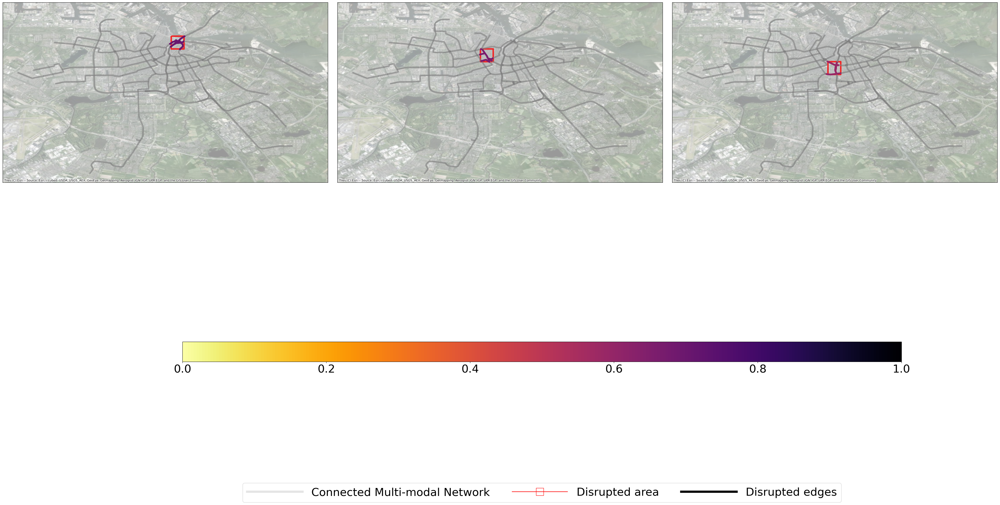

In [147]:
wcl_plt_worst_disrupted_grid(grid_1, worst_dwcl_weights_each_disrupted_grid_1, city_two_layer_network_edges, worst_combined_removed_edges_df_1, worst_removed_edges_df_dict_1, 'no_links_wcl_worst_3_disruption_scenario_grid_1_0917')

### Grid2  0.02

In [148]:
grid_2, grid_edges_dict_2, disruption_scenario_grid_list_2 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.02)

In [149]:
OD_dis_shortest_path_edges_dict_2, removed_edges_df_dict_2, combined_removed_edges_df_2, dwcl_weights_each_disrupted_grid_2 = wcl_each_disrupted_grid(grid_edges_dict_2,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [150]:
worst_dwcl_weights_each_disrupted_grid_2,worst_combined_removed_edges_df_2,worst_removed_edges_df_dict_2 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_2,removed_edges_df_dict_2,combined_removed_edges_df_2)

In [151]:
worst_dwcl_weights_each_disrupted_grid_2

,Grid_num,DWCL_weights
24,43,0.793113
18,36,0.717240
19,37,0.686692


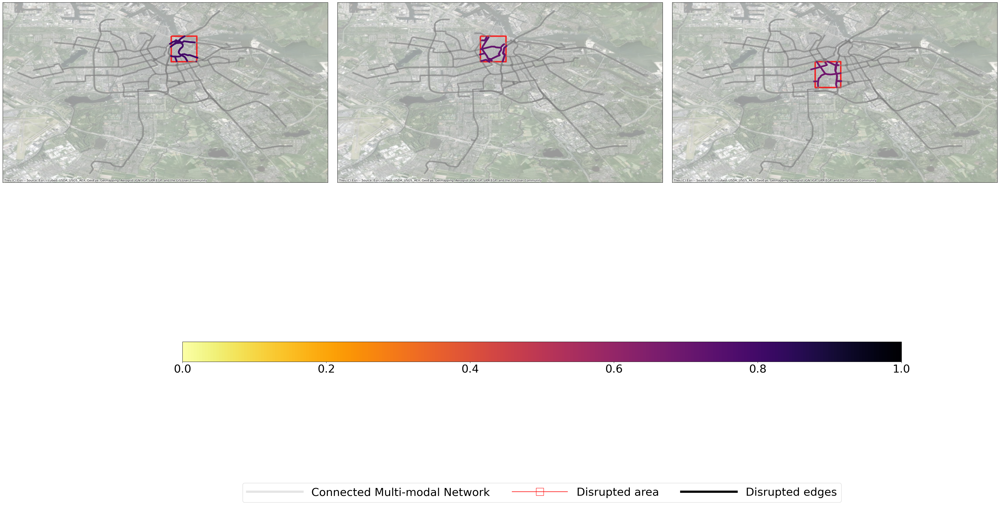

In [152]:
wcl_plt_worst_disrupted_grid(grid_2, worst_dwcl_weights_each_disrupted_grid_2, city_two_layer_network_edges, worst_combined_removed_edges_df_2, worst_removed_edges_df_dict_2, 'no_links_wcl_worst_3_disruption_scenario_grid_2_0917')

### Grid3  0.03

In [153]:
grid_3, grid_edges_dict_3, disruption_scenario_grid_list_3 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.03)

In [154]:
OD_dis_shortest_path_edges_dict_3, removed_edges_df_dict_3, combined_removed_edges_df_3, dwcl_weights_each_disrupted_grid_3 = wcl_each_disrupted_grid(grid_edges_dict_3,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [155]:
worst_dwcl_weights_each_disrupted_grid_3,worst_combined_removed_edges_df_3,worst_removed_edges_df_dict_3 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_3,removed_edges_df_dict_3,combined_removed_edges_df_3)

In [156]:
worst_dwcl_weights_each_disrupted_grid_3

,Grid_num,DWCL_weights
9,16,0.766438
13,20,0.705116
4,11,0.589136


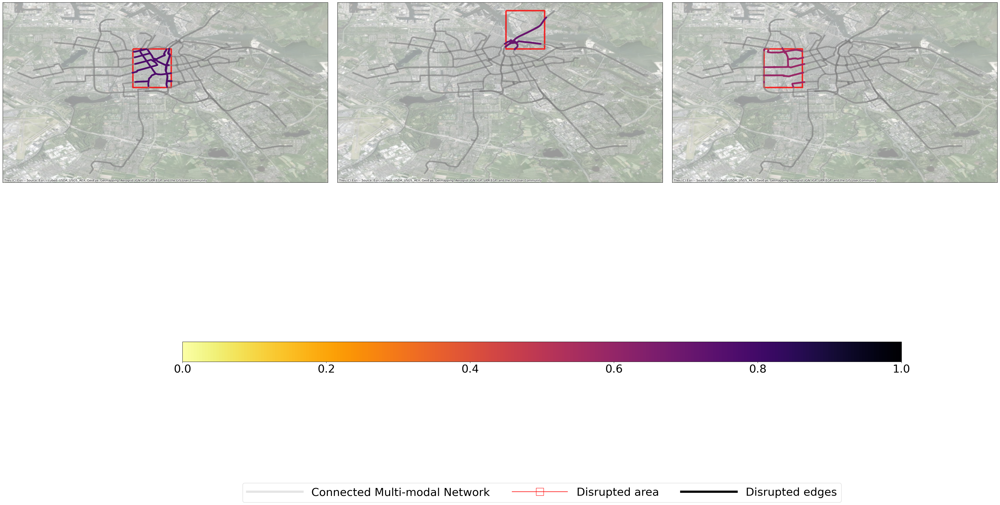

In [157]:
wcl_plt_worst_disrupted_grid(grid_3, worst_dwcl_weights_each_disrupted_grid_3, city_two_layer_network_edges, worst_combined_removed_edges_df_3, worst_removed_edges_df_dict_3, 'no_links_wcl_worst_3_disruption_scenario_grid_3_0917')

## 0916

### Grid1  0.01

In [142]:
grid_1, grid_edges_dict_1, disruption_scenario_grid_list_1 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.01)

In [143]:
OD_dis_shortest_path_edges_dict_1, removed_edges_df_dict_1, combined_removed_edges_df_1, dwcl_weights_each_disrupted_grid_1 = wcl_each_disrupted_grid(grid_edges_dict_1,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [144]:
worst_dwcl_weights_each_disrupted_grid_1,worst_combined_removed_edges_df_1,worst_removed_edges_df_dict_1 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_1,removed_edges_df_dict_1,combined_removed_edges_df_1)

In [145]:
worst_dwcl_weights_each_disrupted_grid_1

,Grid_num,DWCL_weights
60,158,0.705116
47,133,0.662115
59,147,0.591757


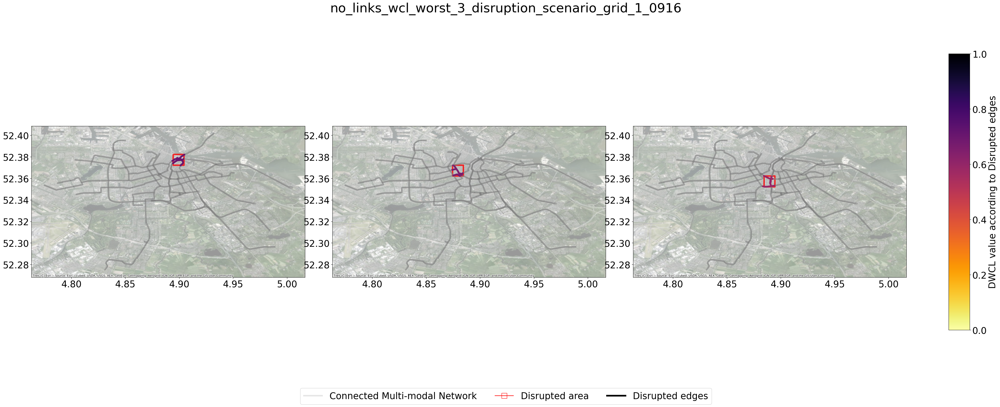

In [157]:
wcl_plt_worst_disrupted_grid(grid_1, worst_dwcl_weights_each_disrupted_grid_1, city_two_layer_network_edges, worst_combined_removed_edges_df_1, worst_removed_edges_df_dict_1, 'no_links_wcl_worst_3_disruption_scenario_grid_1_0916')

### Grid2  0.02

In [147]:
grid_2, grid_edges_dict_2, disruption_scenario_grid_list_2 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.02)

In [148]:
OD_dis_shortest_path_edges_dict_2, removed_edges_df_dict_2, combined_removed_edges_df_2, dwcl_weights_each_disrupted_grid_2 = wcl_each_disrupted_grid(grid_edges_dict_2,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [149]:
worst_dwcl_weights_each_disrupted_grid_2,worst_combined_removed_edges_df_2,worst_removed_edges_df_dict_2 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_2,removed_edges_df_dict_2,combined_removed_edges_df_2)

In [150]:
worst_dwcl_weights_each_disrupted_grid_2

,Grid_num,DWCL_weights
24,43,0.793113
18,36,0.717240
19,37,0.686692


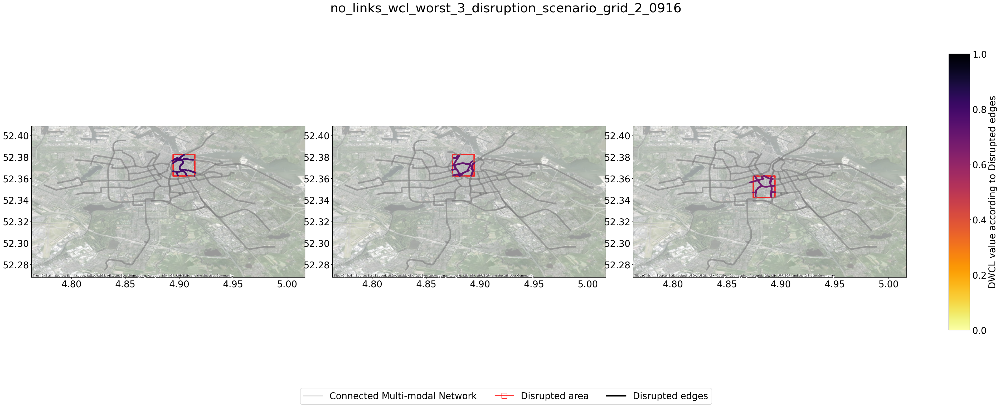

In [151]:
wcl_plt_worst_disrupted_grid(grid_2, worst_dwcl_weights_each_disrupted_grid_2, city_two_layer_network_edges, worst_combined_removed_edges_df_2, worst_removed_edges_df_dict_2, 'no_links_wcl_worst_3_disruption_scenario_grid_2_0916')

### Grid3  0.03

In [152]:
grid_3, grid_edges_dict_3, disruption_scenario_grid_list_3 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.03)

In [153]:
OD_dis_shortest_path_edges_dict_3, removed_edges_df_dict_3, combined_removed_edges_df_3, dwcl_weights_each_disrupted_grid_3 = wcl_each_disrupted_grid(grid_edges_dict_3,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [154]:
worst_dwcl_weights_each_disrupted_grid_3,worst_combined_removed_edges_df_3,worst_removed_edges_df_dict_3 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_3,removed_edges_df_dict_3,combined_removed_edges_df_3)

In [155]:
worst_dwcl_weights_each_disrupted_grid_3

,Grid_num,DWCL_weights
9,16,0.766438
13,20,0.705116
4,11,0.589136


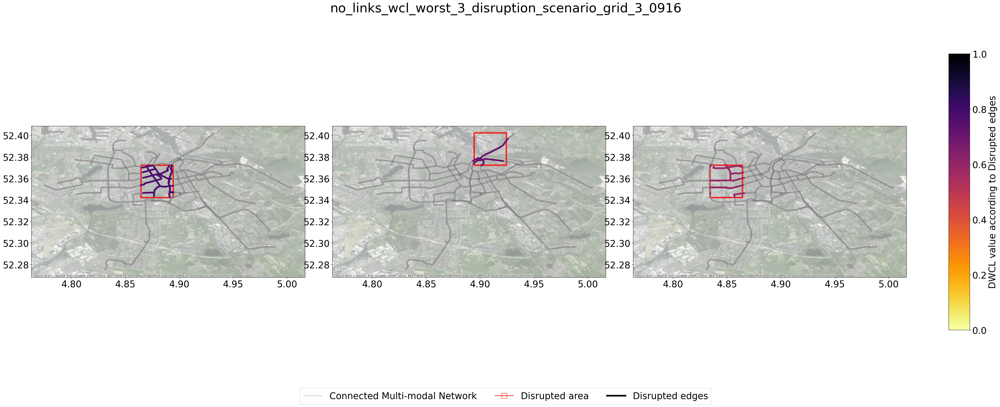

In [156]:
wcl_plt_worst_disrupted_grid(grid_3, worst_dwcl_weights_each_disrupted_grid_3, city_two_layer_network_edges, worst_combined_removed_edges_df_3, worst_removed_edges_df_dict_3, 'no_links_wcl_worst_3_disruption_scenario_grid_3_0916')

## 0913

### Grid1  0.01

In [142]:
grid_1, grid_edges_dict_1, disruption_scenario_grid_list_1 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.01)

In [143]:
OD_dis_shortest_path_edges_dict_1, removed_edges_df_dict_1, combined_removed_edges_df_1, dwcl_weights_each_disrupted_grid_1 = wcl_each_disrupted_grid(grid_edges_dict_1,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [144]:
worst_dwcl_weights_each_disrupted_grid_1,worst_combined_removed_edges_df_1,worst_removed_edges_df_dict_1 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_1,removed_edges_df_dict_1,combined_removed_edges_df_1)

In [145]:
worst_dwcl_weights_each_disrupted_grid_1

,Grid_num,DWCL_weights
60,158,0.705116
47,133,0.662115
59,147,0.591757


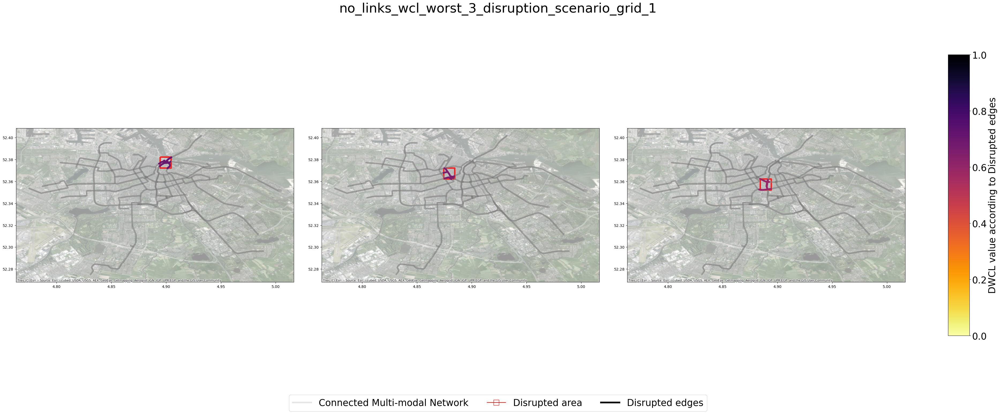

In [146]:
wcl_plt_worst_disrupted_grid(grid_1, worst_dwcl_weights_each_disrupted_grid_1, city_two_layer_network_edges, worst_combined_removed_edges_df_1, worst_removed_edges_df_dict_1, 'no_links_wcl_worst_3_disruption_scenario_grid_1')

### Grid2  0.02

In [147]:
grid_2, grid_edges_dict_2, disruption_scenario_grid_list_2 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.02)

In [148]:
OD_dis_shortest_path_edges_dict_2, removed_edges_df_dict_2, combined_removed_edges_df_2, dwcl_weights_each_disrupted_grid_2 = wcl_each_disrupted_grid(grid_edges_dict_2,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [149]:
worst_dwcl_weights_each_disrupted_grid_2,worst_combined_removed_edges_df_2,worst_removed_edges_df_dict_2 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_2,removed_edges_df_dict_2,combined_removed_edges_df_2)

In [150]:
worst_dwcl_weights_each_disrupted_grid_2

,Grid_num,DWCL_weights
24,43,0.793113
18,36,0.717240
19,37,0.686692


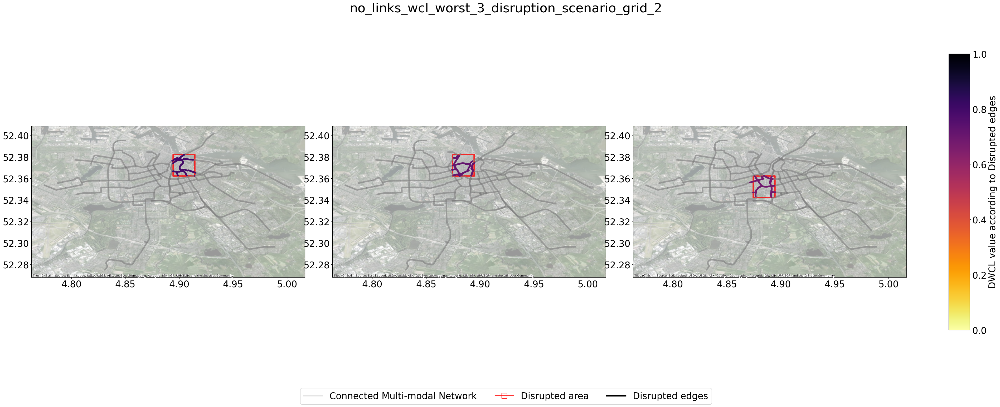

In [151]:
wcl_plt_worst_disrupted_grid(grid_2, worst_dwcl_weights_each_disrupted_grid_2, city_two_layer_network_edges, worst_combined_removed_edges_df_2, worst_removed_edges_df_dict_2, 'no_links_wcl_worst_3_disruption_scenario_grid_2')

### Grid3  0.03

In [152]:
grid_3, grid_edges_dict_3, disruption_scenario_grid_list_3 = edges_in_grid_dfs_dict(city_two_layer_network_edges,0.03)

In [153]:
OD_dis_shortest_path_edges_dict_3, removed_edges_df_dict_3, combined_removed_edges_df_3, dwcl_weights_each_disrupted_grid_3 = wcl_each_disrupted_grid(grid_edges_dict_3,city_two_layer_network_edges,city_two_layer_network_nodes,OD_id_pairs_df,OD_shortest_path_edges,OD_shortest_path_nodes_id)

In [154]:
worst_dwcl_weights_each_disrupted_grid_3,worst_combined_removed_edges_df_3,worst_removed_edges_df_dict_3 = wcl_worst_disrupted_grid_results(dwcl_weights_each_disrupted_grid_3,removed_edges_df_dict_3,combined_removed_edges_df_3)

In [155]:
worst_dwcl_weights_each_disrupted_grid_3

,Grid_num,DWCL_weights
9,16,0.766438
13,20,0.705116
4,11,0.589136


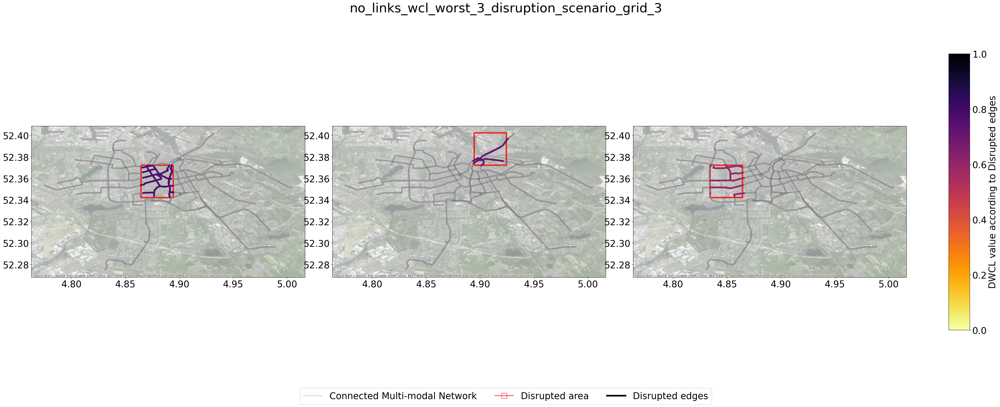

In [156]:
wcl_plt_worst_disrupted_grid(grid_3, worst_dwcl_weights_each_disrupted_grid_3, city_two_layer_network_edges, worst_combined_removed_edges_df_3, worst_removed_edges_df_dict_3, 'no_links_wcl_worst_3_disruption_scenario_grid_3')